In [1]:
from pymongo import ASCENDING, GEOSPHERE, MongoClient
import pandas as pd
from alive_progress import alive_bar
from shapely.geometry import Point, mapping
from keplergl import KeplerGl
import shapely
import json
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import geopandas as gpd
from h3 import h3
import math
import sklearn
import numpy as np
import time

In [2]:
client = MongoClient('mongodb://localhost:27017/')
db = client.osmDataDB
coll_results = db.experimentsResults

In [17]:
results_new = [r for r in coll_results.find({'city': { '$in': ['Warszawa', 'Wrocław', 'Poznań']}})]

In [12]:
coll_results_bak = db.experimentsResultsBak

In [13]:
results_bak = [r for r in coll_results_bak.find({'city': { '$in': ['Warszawa', 'Wrocław', 'Poznań']}})]

In [18]:
results = results_new

In [19]:
def exists_result(res):
    city = res["city"]
    resolution = res["resolution"]
    inbalance_ratio = res["inbalance_ratio"]
    embedding_cls = res["embedding_cls"]
    neighbours = res["neighbours"]
    neighbour_embedding_cls = res["neighbour_embedding_cls"]
    x_processing = res["x_processing"]
    return any([r["city"] == city and r["resolution"] == resolution and r["inbalance_ratio"] == inbalance_ratio and r["embedding_cls"] == embedding_cls and r["neighbours"] == neighbours and r["neighbour_embedding_cls"] == neighbour_embedding_cls and r["x_processing"] == x_processing for r in results])

In [22]:
for result in tqdm(results_bak):
    if not exists_result(result):
        results.append(result)
len(results)

100%|██████████| 5071/5071 [00:05<00:00, 877.50it/s] 


5071

In [23]:
# neighbour_embedding_cls_dict = {
#     'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared Neighbour Embedding',
#     'ConcatenateNeighbourEmbedding': 'Concatenate Neighbour Embedding',
#     'AverageDiminishingNeighbourEmbedding': 'Average Diminishing Neighbour Embedding',
#     'AverageNeighbourEmbedding': 'Average Neighbour Embedding',
# }
processing_dict = {
    'None': 'None',
    'MinMaxScaler': 'Normalization',
    'StandardScaler': 'Standardization'
}
neighbour_embedding_cls_dict = {
    'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared',
    # 'ConcatenateNeighbourEmbedding': 'Concatenate',
    # 'AverageDiminishingNeighbourEmbedding': 'Average Diminishing',
    # 'AverageNeighbourEmbedding': 'Average',
}
embedding_cls_dict = {
    'BaseCountCategoryEmbedding': 'Count Category Embedding',
    'BaseShapeAnalyzerEmbedding': 'Shape Analyzer Embedding',
    'PerCategoryShapeAnalyzerEmbedding300': 'All Tags Shape Analyzer\nEmbedding 300',
    'PerCategoryFilteredShapeAnalyzerEmbedding300': 'Selected Tags Shape Analyzer\nEmbedding 300'
}
metric_dict = {
    'accuracy': 'Accuracy',
    'f1_score': 'F1 Score',
    'custom_metric': 'Custom metric',
}
parsed_results = []
flat_parsed_results = []
for r in results:
    for it in r['results']:
        if r['neighbour_embedding_cls'] in neighbour_embedding_cls_dict and \
            r['embedding_cls'] in embedding_cls_dict and \
            r['x_processing'] in processing_dict:
            parsed_results.append({
                'city': r['city'],
                'resolution': r['resolution'],
                'inbalance_ratio': r['inbalance_ratio'],
                'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                'neighbours': r['neighbours'],
                'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                'processing': processing_dict[r['x_processing']],
                'classfier_cls': it['classfier_cls'],
                'iteration': it['iteration'],
                'dataset_type': it['dataset_type'],
                'Accuracy': it['accuracy'],
                'F1 Score': it['f1_score'],
                'Custom metric': it['custom_metric']
            })
            for metric in ['accuracy', 'custom_metric', 'f1_score']:
                flat_parsed_results.append({
                    'city': r['city'],
                    'resolution': r['resolution'],
                    'inbalance_ratio': r['inbalance_ratio'],
                    'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                    'neighbours': r['neighbours'],
                    'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                    'processing': processing_dict[r['x_processing']],
                    'classfier_cls': it['classfier_cls'],
                    'iteration': it['iteration'],
                    'dataset_type': it['dataset_type'],
                    'metric': metric_dict[metric],
                    'value': it[metric],
                })

In [24]:
df = pd.DataFrame(parsed_results)

In [25]:
df_flat = pd.DataFrame(flat_parsed_results)

In [26]:
for column in ['embedding_cls', 'neighbour_embedding_cls', 'classfier_cls', 'dataset_type', 'city', 'processing']:
    values = list(df[column].unique())
    print(values)
    df[f'{column}_num'] = [values.index(v) for v in df[column]]
df

['Count Category Embedding', 'Shape Analyzer Embedding', 'Selected Tags Shape Analyzer\nEmbedding 300', 'All Tags Shape Analyzer\nEmbedding 300']
['Average Diminishing Squared']
['KNeighborsClassifier', 'SVC', 'RandomForestClassifier', 'AdaBoostClassifier']
['test', 'validation']
['Poznań', 'Warszawa', 'Wrocław']
['Normalization', 'None', 'Standardization']


,city,resolution,inbalance_ratio,embedding_cls,neighbours,neighbour_embedding_cls,processing,classfier_cls,iteration,dataset_type,Accuracy,F1 Score,Custom metric,embedding_cls_num,neighbour_embedding_cls_num,classfier_cls_num,dataset_type_num,city_num,processing_num
0,Poznań,9,1,Count Category Embedding,1,Average Diminishing Squared,Normalization,KNeighborsClassifier,1,test,0.778261,0.788443,0.834783,0,0,0,0,0,0
1,Poznań,9,1,Count Category Embedding,1,Average Diminishing Squared,Normalization,SVC,1,test,0.828986,0.834730,0.875000,0,0,1,0,0,0
2,Poznań,9,1,Count Category Embedding,1,Average Diminishing Squared,Normalization,RandomForestClassifier,1,test,0.826087,0.829489,0.870169,0,0,2,0,0,0
3,Poznań,9,1,Count Category Embedding,1,Average Diminishing Squared,Normalization,AdaBoostClassifier,1,test,0.778261,0.780265,0.830314,0,0,3,0,0,0
4,Poznań,9,1,Count Category Embedding,1,Average Diminishing Squared,Normalization,KNeighborsClassifier,1,validation,0.871429,0.873239,0.904762,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149755,Wrocław,11,5,All Tags Shape Analyzer\nEmbedding 300,25,Average Diminishing Squared,Standardization,AdaBoostClassifier,10,test,0.852713,0.494383,0.861614,3,0,3,0,2,2
149756,Wrocław,11,5,All Tags Shape Analyzer\nEmbedding 300,25,Average Diminishing Squared,Standardization,KNeighborsClassifier,10,validation,0.841085,0.422535,0.852023,3,0,0,1,2,2
149757,Wrocław,11,5,All Tags Shape Analyzer\nEmbedding 300,25,Average Diminishing Squared,Standardization,SVC,10,validation,0.856589,0.393443,0.860507,3,0,1,1,2,2
149758,Wrocław,11,5,All Tags Shape Analyzer\nEmbedding 300,25,Average Diminishing Squared,Standardization,RandomForestClassifier,10,validation,0.875969,0.578947,0.884731,3,0,2,1,2,2


In [27]:
df.loc[df.city == 'Wrocław'].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49920 entries, 99840 to 149759
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   city                         49920 non-null  object 
 1   resolution                   49920 non-null  int64  
 2   inbalance_ratio              49920 non-null  int64  
 3   embedding_cls                49920 non-null  object 
 4   neighbours                   49920 non-null  int64  
 5   neighbour_embedding_cls      49920 non-null  object 
 6   processing                   49920 non-null  object 
 7   classfier_cls                49920 non-null  object 
 8   iteration                    49920 non-null  int64  
 9   dataset_type                 49920 non-null  object 
 10  Accuracy                     49920 non-null  float64
 11  F1 Score                     49920 non-null  float64
 12  Custom metric                49920 non-null  float64
 13  embedding_c

In [28]:
grpd = df_flat.groupby(['city', 'embedding_cls', 'processing']).count()
grpd
    

Standardization       12480   
         Selected Tags Shape Analyzer\nEmbedding 300 None                  12480   
                                                     Normalization         12480   
                                                     Standardization       12480   
         Shape Analyzer Embedding                    None                  12480   
                                                     Normalization         12480   
                                                     Standardization       12480   

                                                                      neighbour_embedding_cls  \
city     embedding_cls                               processing                                 
Poznań   All Tags Shape Analyzer\nEmbedding 300      None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Count Category Embedding                    None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Selected Tags Shape Analyzer\nEmbedding 300 None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Shape Analyzer Embedding                    None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
Warszawa All Tags Shape Analyzer\nEmbedding 300      None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Count Category Embedding                    None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Selected Tags Shape Analyzer\nEmbedding 300 None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Shape Analyzer Embedding                    None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
Wrocław  All Tags Shape Analyzer\nEmbedding 300      None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Count Category Embedding                    None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Selected Tags Shape Analyzer\nEmbedding 300 None                               12480   
                                                     Normalization                      12480   
                                                     Standardization                    12480   
         Shape Analyzer Embedding                    None            

In [14]:
import plotly.graph_objects as go
fig = go.Figure(
    layout=go.Layout(height=600, width=1600),
    data=go.Parcoords(
        # line = dict(color = df['f1_score'], colorscale = 'Electric', showscale = True),
        line = dict(color = df['Custom metric'], colorscale = 'Viridis', showscale = True),
        dimensions = [
             dict(ticktext = df['city'].unique(), tickvals = df['city_num'].unique(),
                        label = 'city', values = df['city_num']),
            dict(ticktext = df['dataset_type'].unique(), tickvals = df['dataset_type_num'].unique(),
                        label = 'dataset_type', values = df['dataset_type_num']),
            dict(ticktext = df['embedding_cls'].unique(), tickvals = df['embedding_cls_num'].unique(),
                 label = 'embedding_cls', values = df['embedding_cls_num']),
            dict(ticktext = df['neighbour_embedding_cls'].unique(), tickvals = df['neighbour_embedding_cls_num'].unique(),
                 label = 'neighbour_embedding_cls', values = df['neighbour_embedding_cls_num']),
            dict(ticktext = df['classfier_cls'].unique(), tickvals = df['classfier_cls_num'].unique(),
                        label = 'classfier_cls', values = df['classfier_cls_num']),
            dict(ticktext = df['resolution'].unique(), tickvals = df['resolution'].unique(),
                        label = 'resolution', values = df['resolution']),
            dict(ticktext = df['neighbours'].unique(), tickvals = df['neighbours'].unique(),
                        label = 'neighbours', values = df['neighbours']),
            dict(ticktext = df['inbalance_ratio'].unique(), tickvals = df['inbalance_ratio'].unique(),
                        label = 'inbalance_ratio', values = df['inbalance_ratio']),
            dict(range = [0.5,1],
                 label = 'Accuracy', values = df['Accuracy']),
            dict(range = [0.5,1],
                 label = 'Custom metric', values = df['Custom metric']),
            dict(range = [0,1],
                 label = 'F1 Score', values = df['F1 Score'])
        ]
    )
)
fig.show()

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
# sns.set_theme()
sns.set_style("whitegrid")
# sns.set_style("white")

In [30]:
def vertical_mean_line(x, y, **kwargs):
    # print(x)
    # print(y)
    ax = plt.gca()
    for i, inbalance_ratio in enumerate(['1','2','3','5']):
        x_filtered = x.loc[y == inbalance_ratio]
        v = x_filtered.mean()
        # plt.axvline(v, ymin=1 - (0.25 + 0.25 * i), ymax=1 - (0.25 * i), **kwargs)
        plt.axvline(v, ymin=0.96 - (0.23 + 0.23 * i), ymax=0.96 - (0.23 * i), **kwargs)
        ax.text(0.1, 0.96 - (0.1 + 0.23 * i), f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(), ha='center', va='top')
        ax.yaxis.grid(False)

def vertical_mean_line_base(x, **kwargs):
    ax = plt.gca()
    v = x.mean()
    plt.axvline(v, ymin=0.05, **kwargs)
    ax.text(v, .03, f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(),
            ha='center', va='top')

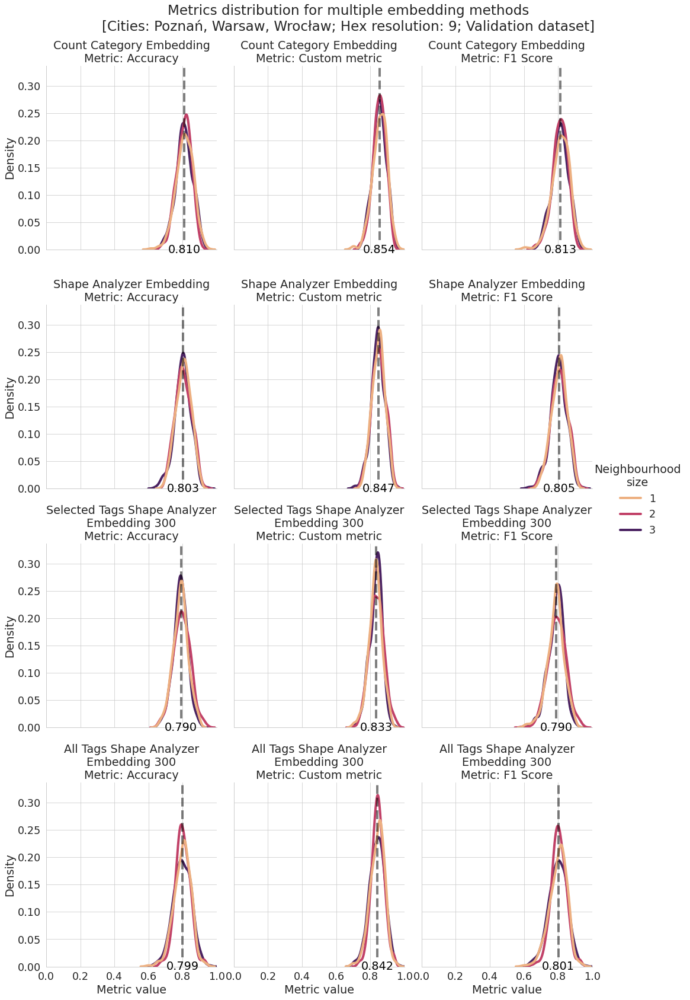

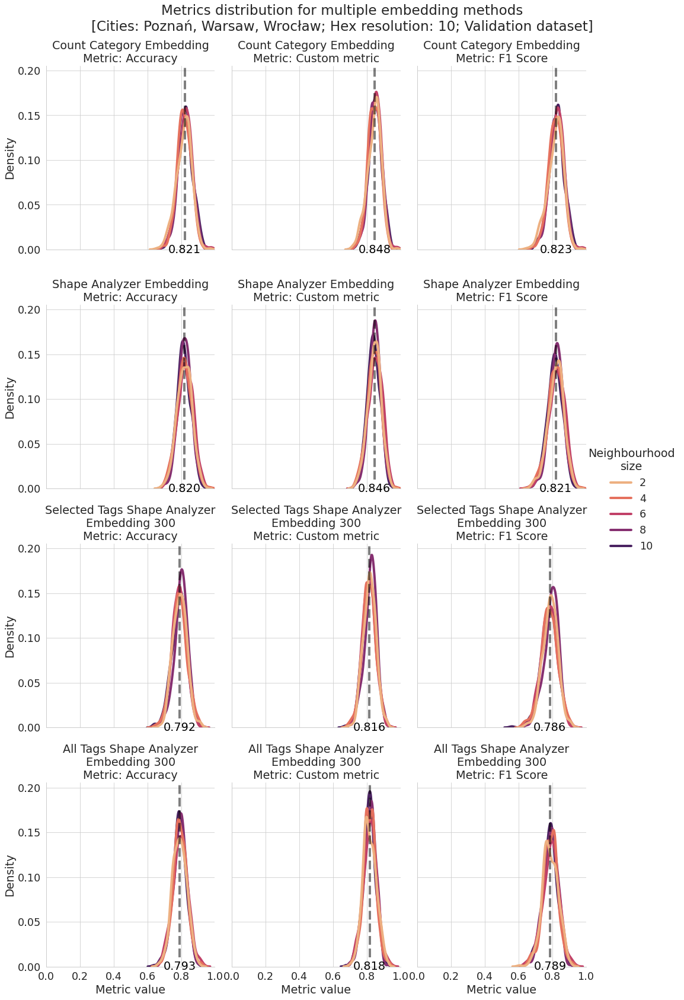

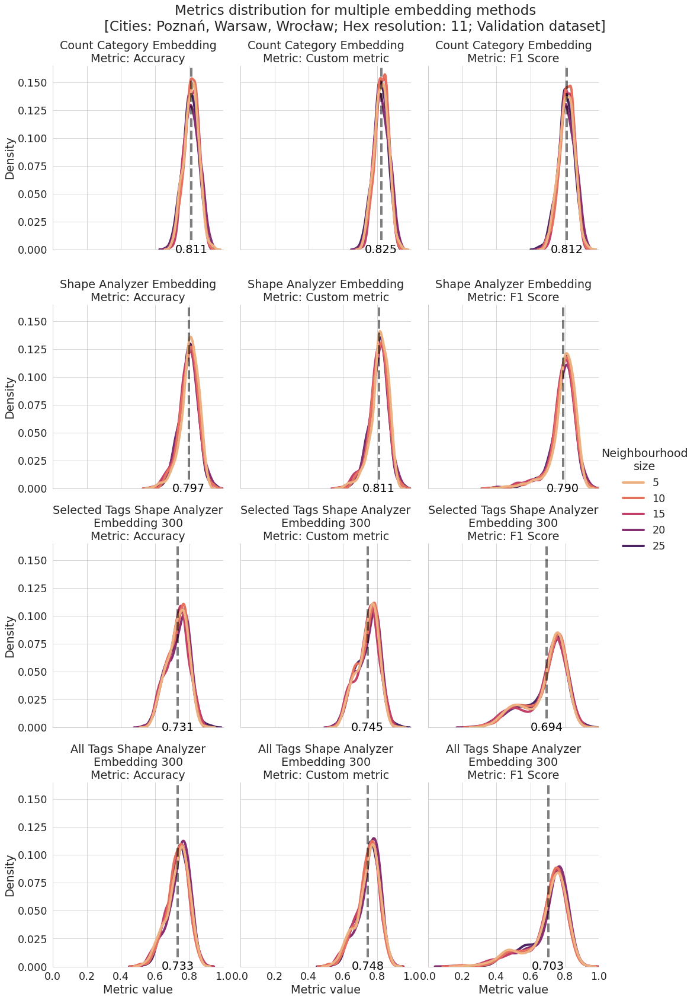

In [32]:
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 4})
# with sns.plotting_context(font_scale=1.5):
for res in [9, 10, 11]:
# for metric in ['f1_score', 'accuracy', 'custom_metric']:
    filtered_df = df_flat.loc[(df_flat.resolution == res) & (df_flat.dataset_type == 'validation') & (df_flat.neighbours > 0) & (df_flat.inbalance_ratio == 1)]
    g = sns.displot(
        data=filtered_df, x="value", 
        hue="neighbours", 
        # hue="processing", 
        # hue="inbalance_ratio", 
        row="embedding_cls", col="metric",
        # facet_kws=dict(row_order=['Concatenate', 'Average', 'Average Diminishing', 'Average Diminishing Squared']),
        kind="kde", height=6, aspect=0.8, palette="flare"
    )
    plt.xlim(0, 1)
    # g.set_axis_labels("Density", f"Metric: {metric}")
    g.map(vertical_mean_line_base, 'value', color='k', ls='--', alpha=0.5)
    g.set_axis_labels("Metric value", "Density")
    g.set_titles("{row_name}\nMetric: {col_name}")
    g.fig.subplots_adjust(wspace=0.1, hspace=0.3)
    g.fig.subplots_adjust(top=0.92) # adjust the Figure in rp
    g.fig.suptitle(f'Metrics distribution for multiple embedding methods\n[Cities: Poznań, Warsaw, Wrocław; Hex resolution: {res}; Validation dataset]')
    # plt.legend(title='Neighbourhood size')
    g._legend.set_title("Neighbourhood\nsize")
    g._legend.get_title().set_multialignment('center')
    # plt.tight_layout()
    # plt.savefig(f'embedding_methods_{res}.pdf', dpi=300, format='pdf', bbox_inches='tight')